In [4]:
import numpy as np
import pandas as pd
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve
from pandas_profiling import ProfileReport

ModuleNotFoundError: No module named 'pandas_profiling'

In [13]:
wine = pd.read_csv("winequality-red.csv", sep=';')

In [14]:
wine

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [4]:
wine_profile = ProfileReport(wine)
wine_profile

NumExpr defaulting to 8 threads.


In [15]:
x = wine.drop(columns = 'quality')
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [16]:
y = wine[['quality']]
y

,quality
0,5
1,5
2,5
3,6
4,5
...,...
1594,5
1595,6
1596,6
1597,5


In [17]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=23, test_size=0.25)

In [18]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
139,7.8,0.560,0.19,2.0,0.081,17.0,108.0,0.99620,3.32,0.54,9.5
1469,7.3,0.980,0.05,2.1,0.061,20.0,49.0,0.99705,3.31,0.55,9.7
432,11.9,0.370,0.69,2.3,0.078,12.0,24.0,0.99580,3.00,0.65,12.8
1295,6.6,0.630,0.00,4.3,0.093,51.0,77.5,0.99558,3.20,0.45,9.5
715,7.2,0.490,0.18,2.7,0.069,13.0,34.0,0.99670,3.29,0.48,9.2
...,...,...,...,...,...,...,...,...,...,...,...
1512,6.4,0.790,0.04,2.2,0.061,11.0,17.0,0.99588,3.53,0.65,10.4
950,8.9,0.120,0.45,1.8,0.075,10.0,21.0,0.99552,3.41,0.76,11.9
1064,8.2,0.740,0.09,2.0,0.067,5.0,10.0,0.99418,3.28,0.57,11.8
742,6.5,0.615,0.00,1.9,0.065,9.0,18.0,0.99720,3.46,0.65,9.2


In [19]:
dt_model = DecisionTreeClassifier()

In [20]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [21]:
# Plot decision tree

import matplotlib.pyplot as plt
%matplotlib inline

In [22]:
import sklearn
sklearn.__version__

'0.24.1'

[Text(678.5902648143602, 530.01, 'X[10] <= 10.525\ngini = 0.646\nsamples = 1199\nvalue = [8, 40, 511, 471, 155, 14]'),
 Text(469.61250048444606, 502.83000000000004, 'X[6] <= 98.5\ngini = 0.547\nsamples = 737\nvalue = [6, 26, 430, 244, 30, 1]'),
 Text(335.7822560329682, 475.65000000000003, 'X[1] <= 0.555\ngini = 0.572\nsamples = 650\nvalue = [6, 25, 349, 240, 29, 1]'),
 Text(144.28648201736254, 448.47, 'X[9] <= 0.585\ngini = 0.582\nsamples = 323\nvalue = [1, 6, 139, 154, 22, 1]'),
 Text(48.90285241835469, 421.29, 'X[10] <= 9.75\ngini = 0.514\nsamples = 107\nvalue = [0, 5, 64, 38, 0, 0]'),
 Text(29.526250516742454, 394.11, 'X[4] <= 0.08\ngini = 0.399\nsamples = 63\nvalue = [0, 3, 47, 13, 0, 0]'),
 Text(14.763125258371227, 366.93000000000006, 'X[3] <= 1.95\ngini = 0.533\nsamples = 31\nvalue = [0, 2, 18, 11, 0, 0]'),
 Text(7.381562629185614, 339.75, 'X[1] <= 0.3\ngini = 0.245\nsamples = 14\nvalue = [0, 0, 12, 2, 0, 0]'),
 Text(3.690781314592807, 312.57000000000005, 'gini = 0.0\nsamples = 2

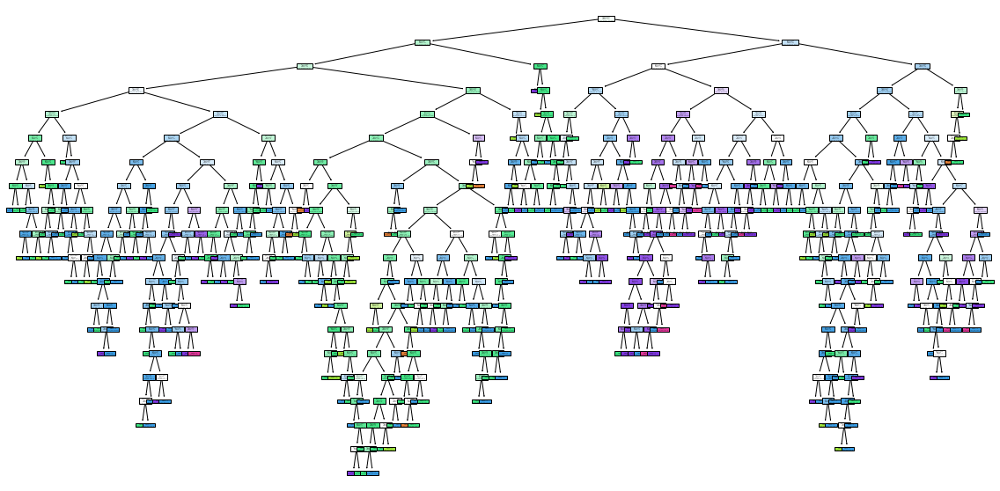

In [23]:
plt.figure(figsize=(20,10))
tree.plot_tree(dt_model, filled=True)

In [24]:
df = wine.head(30)

In [25]:
x1 = df.drop(columns='quality')

In [26]:
x1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5


In [27]:
y1 = df.quality

In [28]:
y1

0     5
1     5
2     5
3     6
4     5
5     5
6     5
7     7
8     7
9     5
10    5
11    5
12    5
13    5
14    5
15    5
16    7
17    5
18    4
19    6
20    6
21    5
22    5
23    5
24    6
25    5
26    5
27    5
28    5
29    6
Name: quality, dtype: int64

In [29]:
dt_model_small = DecisionTreeClassifier()
dt_model_small.fit(x1,y1)

DecisionTreeClassifier()

[Text(418.5, 498.3, 'X[1] <= 0.355\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(186.0, 407.70000000000005, 'X[6] <= 81.5\ngini = 0.375\nsamples = 4\nvalue = [0, 0, 3, 1]'),
 Text(93.0, 317.1, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3, 0]'),
 Text(279.0, 317.1, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(651.0, 407.70000000000005, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(465.0, 317.1, 'X[4] <= 0.076\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]'),
 Text(372.0, 226.5, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]'),
 Text(558.0, 226.5, 'X[10] <= 9.65\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]'),
 Text(465.0, 135.89999999999998, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(651.0, 135.89999999999998, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]'),
 Text(837.0, 317.1, 'X[5] <= 7.5\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]'),
 Text(744.0, 226.5, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]'),
 Text(9

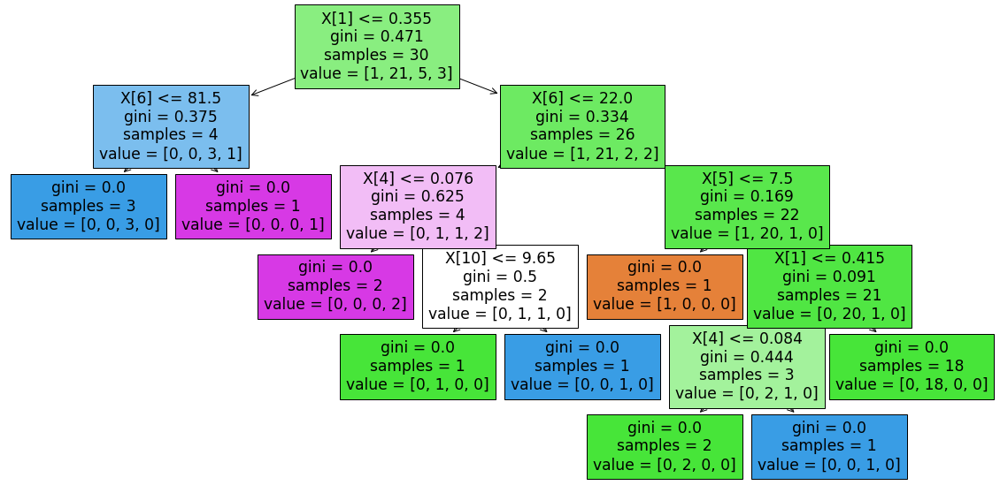

In [30]:
plt.figure(figsize=(20,10))
tree.plot_tree(dt_model_small, filled=True)

In [31]:
y1.unique

<bound method Series.unique of 0     5
1     5
2     5
3     6
4     5
5     5
6     5
7     7
8     7
9     5
10    5
11    5
12    5
13    5
14    5
15    5
16    7
17    5
18    4
19    6
20    6
21    5
22    5
23    5
24    6
25    5
26    5
27    5
28    5
29    6
Name: quality, dtype: int64>

In [32]:
set(y1)

{4, 5, 6, 7}

In [33]:
list_of_strings = df.columns
list_of_strings

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

[Text(418.5, 996.6, 'volatile acidity <= 0.355\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(186.0, 815.4000000000001, 'total sulfur dioxide <= 81.5\ngini = 0.375\nsamples = 4\nvalue = [0, 0, 3, 1]'),
 Text(93.0, 634.2, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3, 0]'),
 Text(279.0, 634.2, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(651.0, 815.4000000000001, 'total sulfur dioxide <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(465.0, 634.2, 'chlorides <= 0.076\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]'),
 Text(372.0, 453.0, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]'),
 Text(558.0, 453.0, 'alcohol <= 9.65\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]'),
 Text(465.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(651.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]'),
 Text(837.0, 634.2, 'free sulfur dioxide <= 7.5\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]'),
 Text(744.0, 

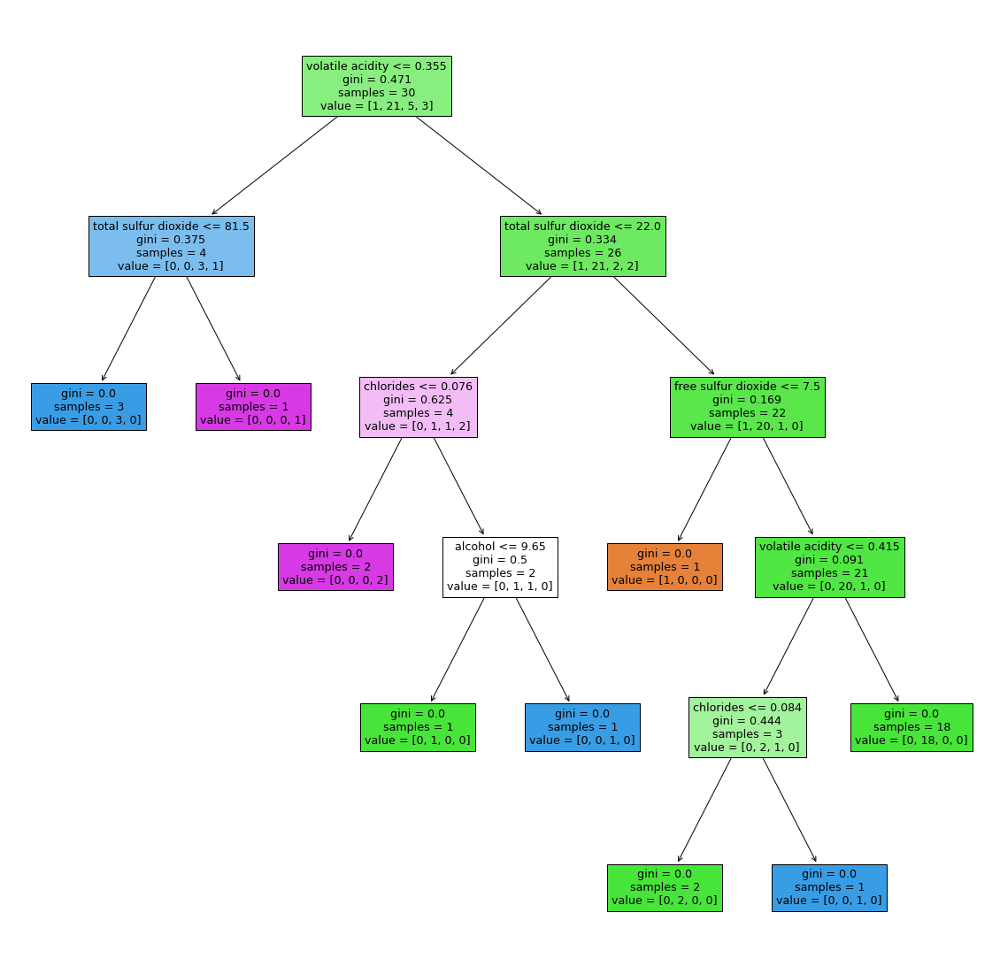

In [34]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_small, filled=True, feature_names=list_of_strings)

In [35]:
# Post Pruning - to be done after checking accuracy of the model

dt_model_small.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6], dtype=int64)

In [36]:
dt_model_small.score(x1,y1) # Overfitted sample

1.0

In [37]:
dt_model_small.score(x_test, y_test)  # Less accuracy with random sample, so need hyperparameter tuning

0.4375

In [38]:
dt_model_small.score(x_train, y_train)  

0.4378648874061718

In [39]:
dt_model.score(x_test, y_test) # Score for the complete dataset model

0.6125

In [40]:
# Improving the model score

path = dt_model_small.cost_complexity_pruning_path(x1, y1)
path

{'ccp_alphas': array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
        0.06075036, 0.08216783, 0.13136752]),
 'impurities': array([0.        , 0.06349206, 0.0968254 , 0.1468254 , 0.1968254 ,
        0.25757576, 0.33974359, 0.47111111])}

In [41]:
train_score = dt_model_small.score(x1, y1)

In [42]:
train_score

1.0

In [43]:
# We will try to build multiple decision tress with the ccp_alpha values we obtained 

ccp_dt_model_list = []
for ccp in path.ccp_alphas:
    model = DecisionTreeClassifier(ccp_alpha = ccp)
    model.fit(x1,y1)
    ccp_dt_model_list.append(model)

In [44]:
ccp_dt_model_list

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.03174603174603176),
 DecisionTreeClassifier(ccp_alpha=0.03333333333333333),
 DecisionTreeClassifier(ccp_alpha=0.049999999999999996),
 DecisionTreeClassifier(ccp_alpha=0.05),
 DecisionTreeClassifier(ccp_alpha=0.06075036075036072),
 DecisionTreeClassifier(ccp_alpha=0.08216783216783222),
 DecisionTreeClassifier(ccp_alpha=0.1313675213675214)]

In [45]:
ccp_dt_model_list_train_score = [i.score(x1, y1) for i in ccp_dt_model_list]

In [46]:
ccp_dt_model_list_train_score

[1.0,
 0.9666666666666667,
 0.9333333333333333,
 0.9,
 0.8666666666666667,
 0.8333333333333334,
 0.8,
 0.7]

In [47]:
ccp_dt_model_list_test_score = [i.score(x_test, y_test) for i in ccp_dt_model_list]

In [48]:
ccp_dt_model_list_test_score

[0.4925, 0.4125, 0.395, 0.43, 0.4225, 0.4425, 0.4775, 0.425]

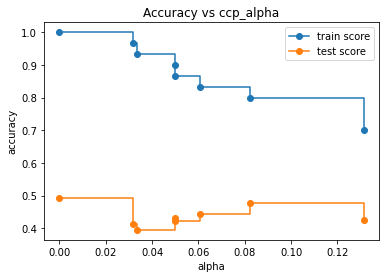

In [49]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs ccp_alpha")
ax.plot(path.ccp_alphas, ccp_dt_model_list_train_score, marker='o', label='train score', drawstyle='steps-post')
ax.plot(path.ccp_alphas, ccp_dt_model_list_test_score, marker='o', label='test score', drawstyle='steps-post')
ax.legend()
plt.show()

In [50]:
df1 = wine.head(500)
x2 = df1.drop(columns = 'quality')
y2 = df1.quality

In [51]:
x2

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
495,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0
496,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.9984,3.43,0.65,9.0
497,7.2,0.34,0.32,2.5,0.090,43.0,113.0,0.9966,3.32,0.79,11.1
498,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0


In [52]:
y2

0      5
1      5
2      5
3      6
4      5
      ..
495    8
496    6
497    5
498    8
499    6
Name: quality, Length: 500, dtype: int64

In [53]:
dt_model_small_2 = DecisionTreeClassifier()

In [54]:
dt_model_small_2.fit(x2,y2)

DecisionTreeClassifier()

In [55]:
path2 = dt_model_small_2.cost_complexity_pruning_path(x2,y2)

In [56]:
path2

{'ccp_alphas': array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
        0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.00261111, 0.00262769, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00271329, 0.00272222, 0.00283333,
        0.003     , 0.003     , 0.003     , 0.003     , 0.00304762,
        0.00305051, 0.00308418, 0.00328205, 0.00333333, 0.00333333,
        0.00334032, 0.00336606, 0.00342857, 0.00343316, 0.0035    ,
        0.0035    , 0.0036    , 0.00363636, 0.00373333, 0.00373809,
        0.0038    , 0.0038237 , 0.004     , 0.00404444, 0.00428571,
        0.00437662, 0.00462338, 0.00465709, 0.00466667, 0.0048    ,
        0.00495726, 0.00504242, 0.00508235, 0.00509091, 0.00510606,
        0.00516667, 0.00568485, 0.00589394, 0.00656364, 0.00671079,
        0.0067591 , 0.00688352, 0.

In [57]:
ccp_dt_model_list_2 = []
for i in path2.ccp_alphas:
    model = DecisionTreeClassifier(ccp_alpha=i)
    model.fit(x2,y2)
    ccp_dt_model_list_2.append(model)
    
ccp_dt_model_list_2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.0018500000000000005),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 DecisionTreeClassifier(ccp_alpha=0.0026666666666666666),
 DecisionTreeClassifier(ccp_alpha=0.0026666666

In [58]:
ccp_dt_model_list_train_score_2 = []
ccp_dt_model_list_train_score_2 = [i.score(x2, y2) for i in ccp_dt_model_list_2]

In [59]:
ccp_dt_model_list_train_score_2

[1.0,
 0.996,
 0.994,
 0.994,
 0.992,
 0.988,
 0.988,
 0.964,
 0.96,
 0.964,
 0.962,
 0.96,
 0.962,
 0.964,
 0.962,
 0.96,
 0.962,
 0.952,
 0.948,
 0.93,
 0.928,
 0.93,
 0.932,
 0.926,
 0.93,
 0.928,
 0.928,
 0.928,
 0.928,
 0.926,
 0.918,
 0.916,
 0.92,
 0.918,
 0.916,
 0.91,
 0.91,
 0.904,
 0.896,
 0.896,
 0.9,
 0.896,
 0.888,
 0.888,
 0.886,
 0.884,
 0.878,
 0.878,
 0.878,
 0.872,
 0.87,
 0.87,
 0.858,
 0.854,
 0.856,
 0.852,
 0.848,
 0.824,
 0.828,
 0.814,
 0.81,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.596,
 0.596,
 0.596,
 0.558,
 0.478]

In [60]:
ccp_dt_model_list_test_score_2 = []
ccp_dt_model_list_test_score_2 = [i.score(x_test, y_test) for i in ccp_dt_model_list_2]

In [61]:
ccp_dt_model_list_test_score_2

[0.6175,
 0.59,
 0.595,
 0.6025,
 0.6175,
 0.5925,
 0.6125,
 0.605,
 0.585,
 0.6,
 0.5875,
 0.59,
 0.5925,
 0.6125,
 0.605,
 0.595,
 0.5775,
 0.5975,
 0.6225,
 0.605,
 0.6175,
 0.6175,
 0.6225,
 0.5875,
 0.6175,
 0.6,
 0.605,
 0.63,
 0.625,
 0.5975,
 0.6075,
 0.6275,
 0.5975,
 0.605,
 0.61,
 0.5875,
 0.6325,
 0.605,
 0.6375,
 0.64,
 0.615,
 0.615,
 0.635,
 0.6275,
 0.62,
 0.63,
 0.6325,
 0.62,
 0.62,
 0.62,
 0.6275,
 0.6175,
 0.6225,
 0.6175,
 0.625,
 0.6275,
 0.62,
 0.64,
 0.635,
 0.635,
 0.6475,
 0.645,
 0.65,
 0.6425,
 0.6425,
 0.6475,
 0.645,
 0.6325,
 0.6375,
 0.6375,
 0.645,
 0.6475,
 0.6475,
 0.635,
 0.6425,
 0.6375,
 0.64,
 0.625,
 0.6325,
 0.6225,
 0.6175,
 0.6175,
 0.605,
 0.6275,
 0.6275,
 0.6275,
 0.605,
 0.425]

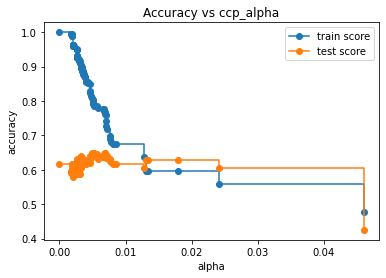

In [62]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs ccp_alpha")
ax.plot(path2.ccp_alphas, ccp_dt_model_list_train_score_2, marker='o', label='train score', drawstyle='steps-post')
ax.plot(path2.ccp_alphas, ccp_dt_model_list_test_score_2, marker='o', label='test score', drawstyle='steps-post')
ax.legend()
plt.show()

In [63]:
# Now we will create model with ccp_alpha between 0.014 and 0.023

dt_model_ccp_range = DecisionTreeClassifier(random_state=0,ccp_alpha=0.014)

In [64]:
dt_model_ccp_range

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

In [71]:
dt_model_ccp_range.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(669.5999999999999, 906.0, 'X[10] <= 10.525\ngini = 0.646\nsamples = 1199\nvalue = [8, 40, 511, 471, 155, 14]'),
 Text(446.4, 543.6, 'X[6] <= 98.5\ngini = 0.547\nsamples = 737\nvalue = [6, 26, 430, 244, 30, 1]'),
 Text(223.2, 181.19999999999993, 'gini = 0.572\nsamples = 650\nvalue = [6, 25, 349, 240, 29, 1]'),
 Text(669.5999999999999, 181.19999999999993, 'gini = 0.131\nsamples = 87\nvalue = [0, 1, 81, 4, 1, 0]'),
 Text(892.8, 543.6, 'gini = 0.653\nsamples = 462\nvalue = [2, 14, 81, 227, 125, 13]')]

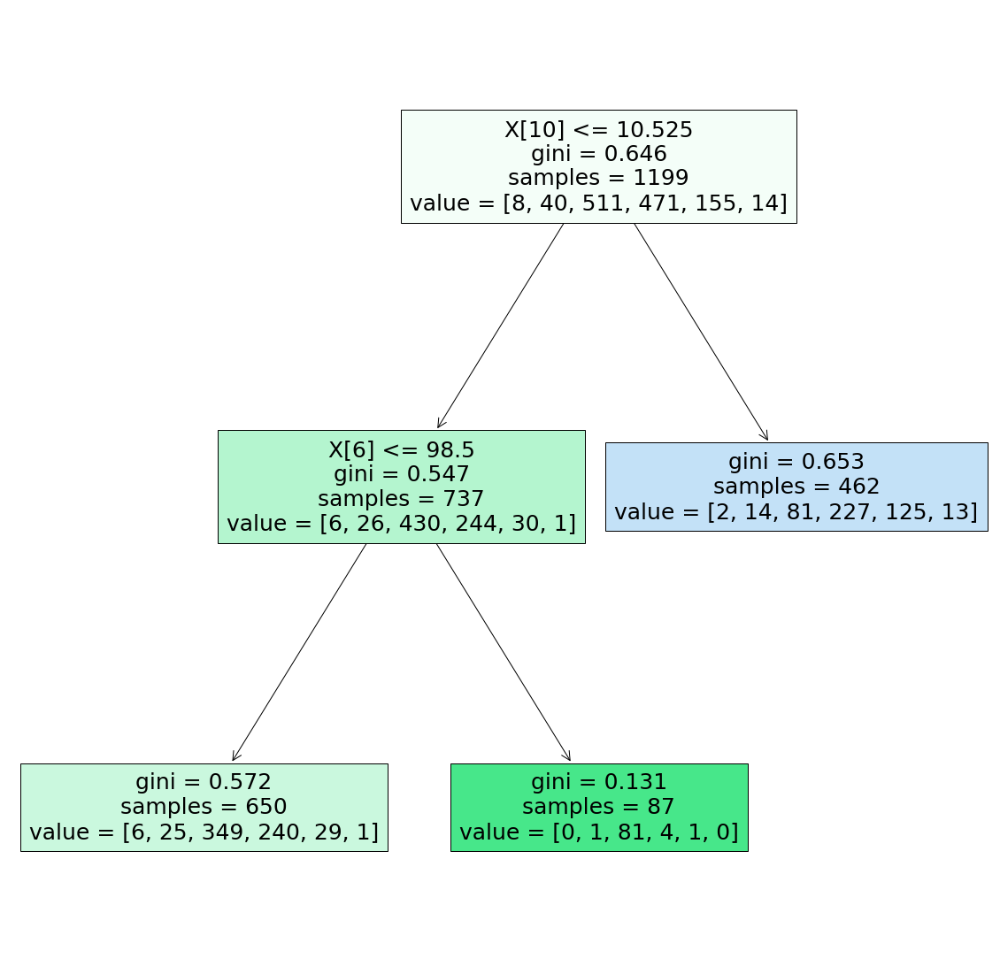

In [72]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp_range, filled=True)

In [73]:
 dt_model_ccp_range.score(x_train, y_train)

0.5479566305254379

In [74]:
 dt_model_ccp_range.score(x_test, y_test)

0.57

In [77]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [79]:
'''
ccp_alpha is only 1 paramater which we have manipulated by the above experiments. But there are multiple such parameters in DecisionTreeClassifier() which we can control. But experimenting with each parameter it will take a long time.
In this case, we can use GridSearchCV or RandomSearchCV and can find best possible paramaters at the same time.
'''

# Using Grid Search CV
# criterion, splitter, max_depth and so on are all parameters which the DecisionTreeClasifier provided


grid_parameters = {
    "criterion" : ['gini','entropy'],
    "splitter" : ['best','random'],
    "max_depth" : range(2,40,1),
    "min_samples_split" : range(2,10,1),
    "min_samples_leaf" : range(1,10,1)
}

In [81]:
gridCV_ccp = GridSearchCV(estimator=dt_model_ccp_range, param_grid=grid_parameters, cv=5, n_jobs=-1)

In [82]:
gridCV_ccp

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [83]:
gridCV_ccp.fit(x2,y2)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [84]:
gridCV_ccp.best_params_

{'criterion': 'entropy',
 'max_depth': 15,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'splitter': 'random'}

In [85]:
dt_model_ccp_range_bestparams = DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=15,
                                                      min_samples_leaf=2, min_samples_split=2, splitter='random')

In [86]:
dt_model_ccp_range_bestparams

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=15,
                       min_samples_leaf=2, splitter='random')

In [88]:
dt_model_ccp_range_bestparams.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=15,
                       min_samples_leaf=2, splitter='random')

In [89]:
dt_model_ccp_range_bestparams.fit(x2,y2)

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=15,
                       min_samples_leaf=2, splitter='random')

In [90]:
dt_model_ccp_range_bestparams.score(x2,y2)

0.622

In [91]:
dt_model_ccp_range_bestparams.score(x_test,y_test)

0.5725

In [93]:
# Predictions

pred = dt_model_ccp_range_bestparams.predict(x_test)

In [94]:
pred

array([5, 5, 5, 6, 5, 5, 6, 5, 5, 5, 5, 6, 5, 5, 6, 5, 5, 5, 6, 6, 6, 6,
       6, 6, 5, 6, 5, 5, 6, 5, 6, 5, 6, 5, 5, 5, 6, 6, 5, 5, 5, 5, 6, 5,
       6, 6, 5, 5, 5, 5, 5, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 6, 6,
       5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 5, 5, 5, 5, 5, 6, 5, 6, 6, 6,
       5, 6, 5, 6, 5, 6, 5, 5, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5,
       5, 5, 5, 6, 5, 5, 5, 6, 6, 5, 5, 5, 6, 6, 5, 5, 6, 5, 6, 6, 6, 6,
       6, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 5, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6,
       5, 6, 5, 6, 5, 6, 5, 6, 6, 6, 5, 5, 6, 5, 5, 6, 5, 4, 6, 6, 6, 5,
       6, 5, 5, 5, 5, 6, 5, 5, 6, 6, 6, 5, 5, 5, 6, 6, 6, 5, 5, 5, 6, 6,
       5, 5, 6, 5, 5, 6, 4, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5,
       5, 6, 6, 5, 5, 4, 5, 6, 6, 5, 5, 5, 5, 6, 5, 6, 6, 5, 6, 5, 6, 6,
       5, 5, 5, 6, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 6, 5, 6,
       5, 5, 6, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 6, 5, 6, 6, 5, 6,
       5, 6, 6, 6, 5, 6, 5, 5, 5, 6, 5, 6, 5, 5, 5,

In [95]:
y_test

,quality
1596,6
201,5
167,4
1011,6
604,6
...,...
1062,6
106,5
1090,8
936,6


In [97]:
confusion_matrix(y_test, pred)

array([[  0,   0,   1,   1,   0,   0],
       [  0,   1,   8,   4,   0,   0],
       [  0,   2, 132,  36,   0,   0],
       [  0,   1,  70,  96,   0,   0],
       [  0,   0,  11,  33,   0,   0],
       [  0,   0,   1,   3,   0,   0]], dtype=int64)